In [122]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
from torch.utils.data import DataLoader, Dataset
from sklearn.utils import shuffle
from sklearn.decomposition import PCA, KernelPCA
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap

import utils
import utils.metrics
import utils.gmm
import utils.representation_layer
import importlib
importlib.reload(utils)
importlib.reload(utils.metrics)
importlib.reload(utils.gmm)
importlib.reload(utils.representation_layer)
from utils.metrics import ClusteringMetrics
from utils.representation_layer import RepresentationLayer
from utils.gmm import GaussianMixture

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cuda':
    device = torch.device('cuda:0')
    torch.cuda.set_device(device)
    print('Using device:', torch.cuda.get_device_name(device))
    print(f"Allocated memory: {torch.cuda.memory_allocated(device)/1024**2} MB")
    print(f"Reserved memory: {torch.cuda.memory_reserved(device)/1024**2} MB")
    print(f"Total memory: {torch.cuda.get_device_properties(device).total_memory/1024**2} MB")

random_state = 0

print('Using device:', device)

# Set random seed for reproducibility
random_state = 42
np.random.seed(random_state)
torch.manual_seed(random_state)

# Load and preprocess the gene expression data
data = pd.read_csv("gtex_with_cancer.csv.gz", sep="\t")

folder = "plots/bulk/"
# if folder does not exist, create it
import os
if not os.path.exists(folder):
    os.makedirs(folder)

Using device: NVIDIA GeForce RTX 4060 Laptop GPU
Allocated memory: 358.16650390625 MB
Reserved memory: 1120.0 MB
Total memory: 7836.25 MB
Using device: cuda:0


In [123]:

# Define the GeneExpressionDataset class
class GeneExpressionDataset(Dataset):
    def __init__(self, gtex, label_column='label', scaling_type='mean'):
        self.scaling_type = scaling_type

        # Convert labels to numbers
        self.labels = gtex[label_column].values.astype(np.int64)
        # Remove non-numeric columns except 'label' and 'tissue'
        self.data = gtex.drop(columns=[label_column, 'tissue'], errors='ignore')
        self.data = self.data.select_dtypes(include=[np.number])
        self.data = torch.tensor(self.data.values).float()

    def __len__(self):
        return self.data.shape[0]

    def __getitem__(self, idx):
        expression = self.data[idx, :]
        if self.scaling_type == 'mean':
            lib = torch.mean(expression, dim=-1)
        elif self.scaling_type == 'max':
            lib = torch.max(expression, dim=-1).values
        else:
            lib = torch.sum(expression, dim=-1)
        return idx, expression, lib

    def get_labels(self):
        return self.labels

# Define the Negative Binomial density function
def logNBdensity(k, m, r):
    '''
    Negative Binomial NB(k; m, r), where m is the mean and r is "number of failures"
    k, m, and r can be tensors of the same shape
    '''
    eps = 1e-10
    c = 1.0 / (r + m + eps)
    x = torch.lgamma(k + r) - torch.lgamma(r) - torch.lgamma(k + 1) \
        + k * torch.log(m * c + eps) + r * torch.log(r * c + eps)
    return x

# Define the Negative Binomial layer
class NBLayer(nn.Module):
    def __init__(self, out_dim, r_init, scaling_type='library', reduction='none'):
        super(NBLayer, self).__init__()
        self.log_r = nn.Parameter(torch.full((1, out_dim), np.log(r_init)), requires_grad=True)
        if scaling_type in ['library', 'total_count']:
            self.activation = 'sigmoid'
        elif scaling_type in ['mean', 'median']:
            self.activation = 'softplus'
        else:
            raise ValueError('Unknown scaling type specified.')
        self.reduction = reduction

    def forward(self, x):
        if self.activation == 'sigmoid':
            return torch.sigmoid(x)
        else:
            return F.softplus(x)

    def rescale(self, M, mhat):
        return M * mhat

    def loss(self, x, M, mhat):
        if self.reduction == 'none':
            return -logNBdensity(x, self.rescale(M, mhat), torch.exp(self.log_r))
        elif self.reduction == 'sum':
            return -logNBdensity(x, self.rescale(M, mhat), torch.exp(self.log_r)).sum()

    def logprob(self, x, M, mhat):
        return logNBdensity(x, self.rescale(M, mhat), torch.exp(self.log_r))

    def sample(self, nsample, M, mhat):
        with torch.no_grad():
            m = self.rescale(M, mhat)
            probs = m / (m + torch.exp(self.log_r))
            nb = torch.distributions.NegativeBinomial(torch.exp(self.log_r), probs=probs)
            return nb.sample([nsample]).squeeze()

class DGD(nn.Module):
    def __init__(self, latent, hidden, out, r_init=2, scaling_type='library'):
        super(DGD, self).__init__()

        self.main = nn.ModuleList()

        if type(hidden) is not int:
            n_hidden = len(hidden)
            self.main.append(nn.Linear(latent,hidden[0]))
            self.main.append(nn.ReLU(True))
            for i in range(n_hidden-1):
                self.main.append(nn.Linear(hidden[i],hidden[i+1]))
                self.main.append(nn.ReLU(True))
            self.main.append(nn.Linear(hidden[-1],out))
        else:
            self.main.append(nn.Linear(latent,hidden))
            self.main.append(nn.ReLU(True))
            self.main.append(nn.Linear(hidden,out))

        self.nb = NBLayer(out, r_init=r_init, scaling_type=scaling_type)

    def forward(self, z):
        for i in range(len(self.main)):
            z = self.main[i](z)
        return self.nb(z)


In [124]:
def plot_negbino(mod, tdata, r, e, gmm, t='nb', scaling='library', labels=None, library=None, label_cols=1, scatterplot_sizes = [2, 2, 20]):
    print('epoch: {}'.format(e))
    device = next(mod.parameters()).device

    if library is None:
        if scaling == 'library':
            library = torch.max(tdata, dim=-1).values.unsqueeze(1)
        elif scaling == 'mean':
            library = torch.mean(tdata, dim=-1).unsqueeze(1)

    # Move tensors to the device
    tdata = tdata.to(device)
    library = library.to(device)

    if t == 'nb':
        y = mod(r.z).detach()
        y_scaled = y * library
    else:
        y = mod(r.z)
        y_scaled = y

    # Move data to CPU for plotting
    tdata_cpu = tdata.cpu()
    y_scaled_cpu = y_scaled.cpu()
    library_cpu = library.cpu()

    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(16, 8))
    plt.subplots_adjust(left=None, bottom=0.5, right=None, top=1.5, wspace=None, hspace=None)

    # Datasets for first row of plots
    plotdata = pd.DataFrame({'Data': tdata_cpu[:, 0] + 1,
                             'Type': 'Originals',
                             'Gene': '1'})
    temp = pd.DataFrame({'Data': y_scaled_cpu[:, 0].detach().flatten() + 1,
                         'Type': 'Reconstructions',
                         'Gene': '1'}, index=[x + library_cpu.shape[0] for x in np.arange(library_cpu.shape[0])])
    plotdata = pd.concat([plotdata, temp], ignore_index=True)
    temp = pd.DataFrame({'Data': tdata_cpu[:, 1].flatten() + 1,
                         'Type': 'Originals',
                         'Gene': '2'}, index=[x + 2 * library_cpu.shape[0] for x in np.arange(library_cpu.shape[0])])
    plotdata = pd.concat([plotdata, temp], ignore_index=True)
    temp = pd.DataFrame({'Data': y_scaled_cpu[:, 1].detach().flatten() + 1,
                         'Type': 'Reconstructions',
                         'Gene': '2'}, index=[x + 3 * library_cpu.shape[0] for x in np.arange(library_cpu.shape[0])])
    plotdata = pd.concat([plotdata, temp], ignore_index=True)

    # Compute negative log probabilities
    neg_log_prob = mod.nb.loss(tdata, library, y).detach().cpu()

    plotdata2 = pd.DataFrame({'Originals': tdata_cpu[:, 0] + 1,
                              'Reconstructions': y_scaled_cpu[:, 0].detach().flatten() + 1,
                              'neg_log_prob': neg_log_prob[:, 0].detach().flatten(),
                              'Gene': '1'})
    temp = pd.DataFrame({'Originals': tdata_cpu[:, 1] + 1,
                         'Reconstructions': y_scaled_cpu[:, 1].detach().flatten() + 1,
                         'neg_log_prob': neg_log_prob[:, 1].detach().flatten(),
                         'Gene': '2'}, index=[x + library_cpu.shape[0] for x in np.arange(library_cpu.shape[0])])
    plotdata2 = pd.concat([plotdata2, temp], ignore_index=True)

    # Replace all inf values with nan for plotting
    plotdata2 = plotdata2.replace([np.inf, -np.inf], np.nan)
    plotdata = plotdata.replace([np.inf, -np.inf], np.nan)
    temp = temp.replace([np.inf, -np.inf], np.nan)

    # Gene reconstruction plots
    sns.scatterplot(data=plotdata2[plotdata2['Gene'] == '1'], x='Originals', y='Reconstructions', hue='neg_log_prob', ax=ax[0][0])
    r1 = np.round(torch.exp(mod.nb.log_r[0, 0]).detach().cpu().numpy(), 4)
    ax[0][0].set_title('Gene 1 (r=' + str(r1) + ')')
    ax[0][0].set_yscale('log')
    ax[0][0].set_xscale('log')
    sns.scatterplot(data=plotdata2[plotdata2['Gene'] == '2'], x='Originals', y='Reconstructions', hue='neg_log_prob', ax=ax[0][1])
    r2 = np.round(torch.exp(mod.nb.log_r[0, 1]).detach().cpu().numpy(), 4)
    ax[0][1].set_title('Gene 2 (r=' + str(r2) + ')')
    ax[0][1].set_yscale('log')
    ax[0][1].set_xscale('log')

    # PCA plots with many conditionals
    pca = PCA(n_components=2)
    sampled = gmm.sample(500)[0]
    pca_data = pd.DataFrame(data=r.z.cpu().detach().numpy())
    # Replace all inf values with nan for plotting
    pca_data = pca_data.replace([np.inf, -np.inf], np.nan)
    pca_data['Type'] = 'Reconstructions'
    pca_data['size'] = scatterplot_sizes[0]
    if labels is not None:
        if len(labels) == len(pca_data):
            pca_data['label'] = labels
        else:
            pca_data['label'] = labels[:len(pca_data)]
    temp = pd.DataFrame(data=sampled.cpu().detach().numpy())
    # Replace all inf values with nan for plotting
    temp = temp.replace([np.inf, -np.inf], np.nan)
    temp['Type'] = 'GMM samples'
    temp['size'] = scatterplot_sizes[1]
    if labels is not None:
        temp['label'] = 'GMM samples'
    pca_data = pd.concat([pca_data, temp], ignore_index=True)
    if len(gmm.means_.cpu().detach().numpy().shape) > 1:
        temp = pd.DataFrame(data=gmm.means_.cpu().detach().numpy())
        # Replace all inf values with nan for plotting
        temp = temp.replace([np.inf, -np.inf], np.nan)
        temp['Type'] = 'GMM Means'
        temp['size'] = scatterplot_sizes[2]
        if labels is not None:
            temp['label'] = 'GMM Means'
        pca_data = pd.concat([pca_data, temp], ignore_index=True)
    if labels is not None:
        pca.fit(pca_data.iloc[:, :-3])
        projected = pca.transform(pca_data.iloc[:, :-3])
    else:
        pca.fit(pca_data.iloc[:, :-2])
        projected = pca.transform(pca_data.iloc[:, :-2])
    projected_norm = (projected - np.mean(projected.flatten())) / np.std(projected.flatten())
    pca_data2 = pd.DataFrame(data=projected_norm, columns=['PC1', 'PC2'])
    # Replace all inf values with nan for plotting
    pca_data2 = pca_data2.replace([np.inf, -np.inf], np.nan)
    pca_data2['Type'] = pca_data['Type'].values
    pca_data2['size'] = pca_data['size'].values
    pca_data2['label'] = pca_data['label'].values
    sns.scatterplot(x='PC1', y='PC2', data=pca_data2, hue='Type', size='size', ax=ax[1][0], sizes=(4, 20), palette=['green', 'red', 'black'])
    ax[1][0].legend(loc='upper left')
    if labels is not None:
        sns.scatterplot(x='PC1', y='PC2', data=pca_data2[pca_data2['Type'] == 'Reconstructions'], hue='label', ax=ax[1][1], s=6)
        ax[1][1].legend(loc='upper left')

    plt.savefig(folder + 'negbino_epoch_' + str(e) + '.pdf', format='pdf', dpi=400)
    plt.show()


# Loss plot function
def plot_loss(gmm_train_losses, gmm_test_losses, recon_train_losses, recon_test_losses, epoch):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # GMM Loss Plot
    axes[0].plot(gmm_train_losses, label='Train Loss', color='red')
    axes[0].plot(gmm_test_losses, label='Test Loss', color='green')
    axes[0].set_title('GMM Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # Reconstruction Loss Plot
    axes[1].plot(recon_train_losses, label='Train Loss', color='red')
    axes[1].plot(recon_test_losses, label='Test Loss', color='green')
    axes[1].set_title('Reconstruction Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Loss')
    axes[1].legend()

    # Total Loss Plot
    total_train_losses = [gmm_train_losses[i] + recon_train_losses[i] for i in range(len(gmm_train_losses))]
    total_test_losses = [gmm_test_losses[i] + recon_test_losses[i] for i in range(len(gmm_test_losses))]
    axes[2].plot(total_train_losses, label='Train Loss', color='red')
    axes[2].plot(total_test_losses, label='Test Loss', color='green')
    axes[2].set_title('Total Loss')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Loss')
    axes[2].legend()

    plt.suptitle(f'Losses at Epoch {epoch}', size=16)
    plt.tight_layout()
    plt.savefig(f'{folder}losses_epoch_{epoch}.pdf', format='pdf', dpi=400)
    plt.show()


def plot_latent_space_visualizations(representations, labels, n_features, epoch, fraction=0.05, s=1, alpha=1, perplexity=20, gmm_means=None):
    n_samples = int(fraction * representations.shape[0])
    subset_indices = torch.randperm(representations.shape[0])[:n_samples]
    
    # Detach tensors before converting to NumPy
    representations_subset = representations[subset_indices].detach().cpu().numpy()
    labels_subset = labels[subset_indices].cpu().numpy()
    
    color_codes = ['#a50026', '#d73027', '#f46d43', '#fdae61', '#fee08b',
                   '#d9ef8b', '#a6d96a', '#66bd63', '#1a9850', '#006837']
    loc = 'upper right'
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    if n_features == 2:
        # Plot first vs second component directly
        axes[0, 0].set_title('Latent Space (First vs Second Component)')
        for digit in range(len(np.unique(labels_subset))):
            digit_mask = labels_subset == digit
            axes[0, 0].scatter(representations_subset[digit_mask, 0], representations_subset[digit_mask, 1],
                               color=color_codes[digit % len(color_codes)], alpha=alpha, label=f'{digit}', s=s)
        if gmm_means is not None:
            gmm_means_np = gmm_means.detach().cpu().numpy()
            axes[0, 0].scatter(gmm_means_np[:, 0], gmm_means_np[:, 1], marker='x', color='black', s=70, label='GMM Means')
        axes[0, 0].legend(loc=loc)
    else:
        # PCA
        pca = PCA(n_components=2)
        representations_pca = pca.fit_transform(representations_subset)
        axes[0, 0].set_title('PCA')
        for digit in range(len(np.unique(labels_subset))):
            digit_mask = labels_subset == digit
            axes[0, 0].scatter(representations_pca[digit_mask, 0], representations_pca[digit_mask, 1],
                               color=color_codes[digit % len(color_codes)], alpha=alpha, label=f'{digit}', s=s)
        if gmm_means is not None:
            gmm_means_pca = pca.transform(gmm_means.detach().cpu().numpy())
            axes[0, 0].scatter(gmm_means_pca[:, 0], gmm_means_pca[:, 1], marker='x', color='black', s=70, label='GMM Means')
        axes[0, 0].legend(loc=loc)

    # Kernel PCA
    kpca = KernelPCA(n_components=2, kernel='rbf')
    representations_kpca = kpca.fit_transform(representations_subset)
    axes[0, 1].set_title('Kernel PCA')
    for digit in range(len(np.unique(labels_subset))):
        digit_mask = labels_subset == digit
        axes[0, 1].scatter(representations_kpca[digit_mask, 0], representations_kpca[digit_mask, 1], 
                          color=color_codes[digit % len(color_codes)], alpha=alpha, label=f'{digit}', s=s)
    axes[0, 1].legend(loc=loc)
    
    # t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    representations_tsne = tsne.fit_transform(representations_subset)
    axes[1,0].set_title('t-SNE')
    for digit in range(len(np.unique(labels_subset))):
        digit_mask = labels_subset == digit
        axes[1,0].scatter(representations_tsne[digit_mask, 0], representations_tsne[digit_mask, 1], 
                          color=color_codes[digit % len(color_codes)], alpha=alpha, label=f'{digit}', s=s)
    axes[1,0].legend(loc=loc)
    
    # UMAP
    umap_model = umap.UMAP(n_components=2, random_state=42)
    representations_umap = umap_model.fit_transform(representations_subset)
    axes[1,1].set_title('UMAP')
    for digit in range(len(np.unique(labels_subset))):
        digit_mask = labels_subset == digit
        axes[1,1].scatter(representations_umap[digit_mask, 0], representations_umap[digit_mask, 1], 
                          color=color_codes[digit % len(color_codes)], alpha=alpha, label=f'{digit}', s=s)
    axes[1,1].legend(loc=loc)
    
    plt.suptitle(f'Latent Space Visualizations at Epoch {epoch}', size=16)
    plt.tight_layout()
    plt.savefig(f'{folder}latent_space_epoch_{epoch}.pdf', format='pdf', dpi=400)
    plt.show()


Size of the dataset: (3382, 5002)
Number of components: 7


  0%|          | 0/1000 [00:00<?, ?it/s]

epoch: 0


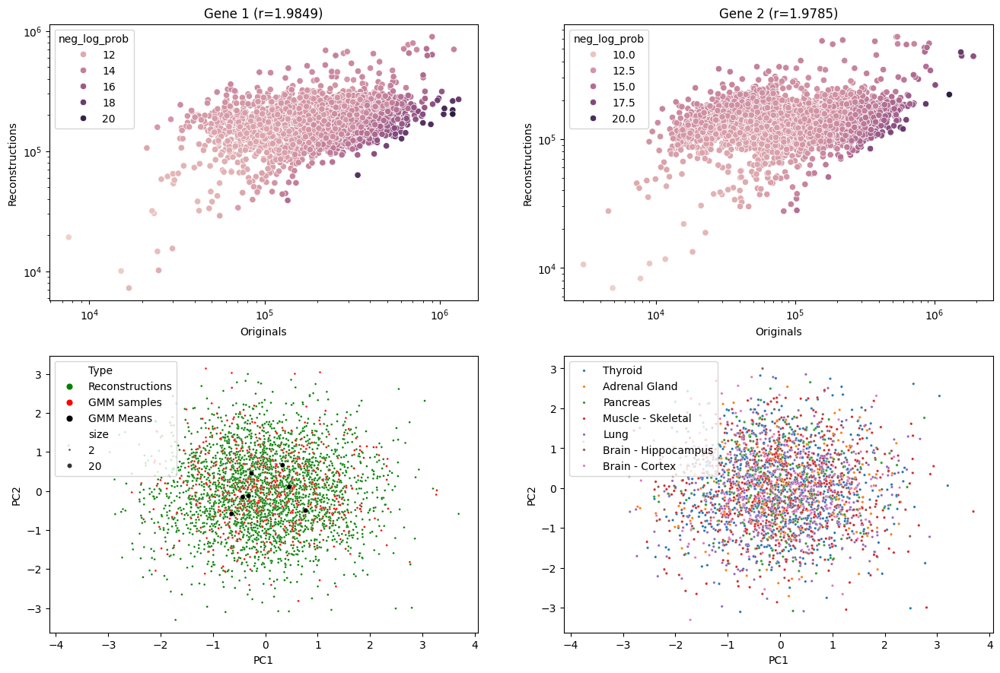

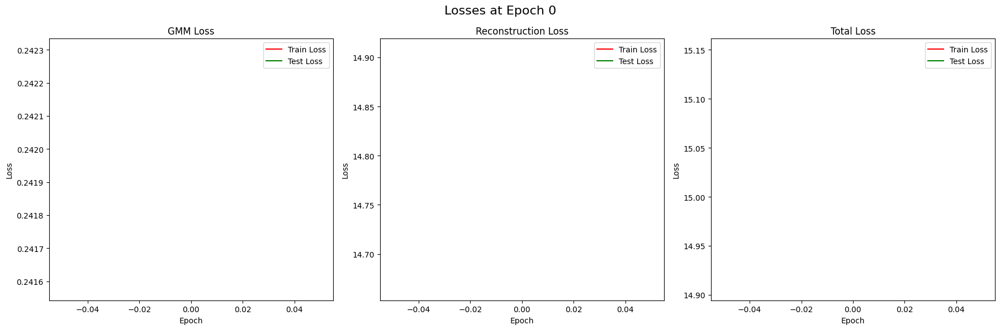

  5%|▌         | 50/1000 [00:45<12:37,  1.25it/s] 

epoch: 50


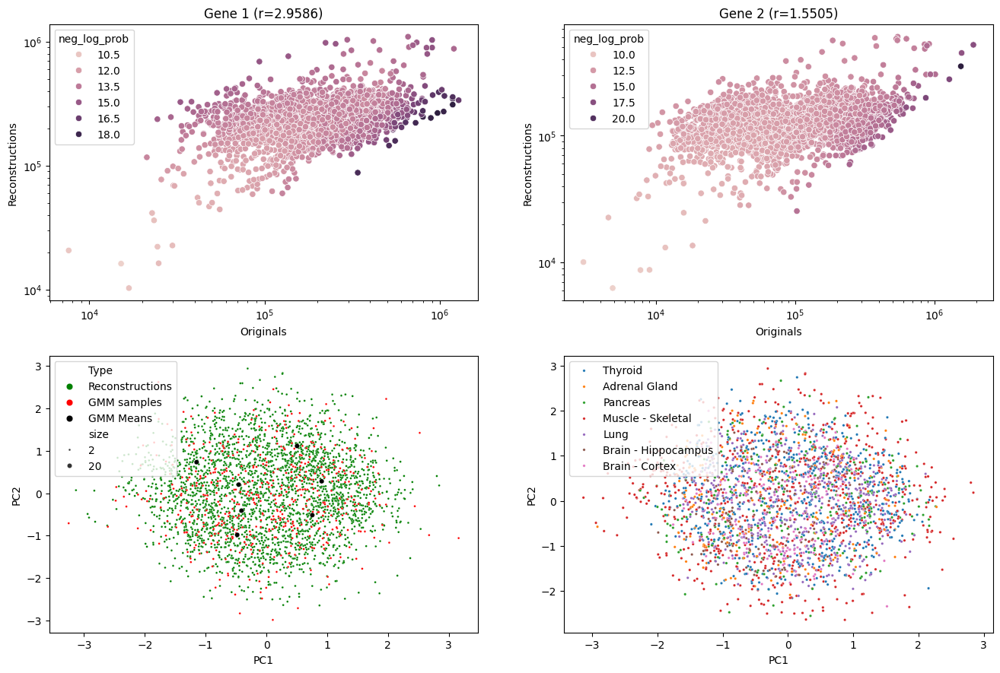

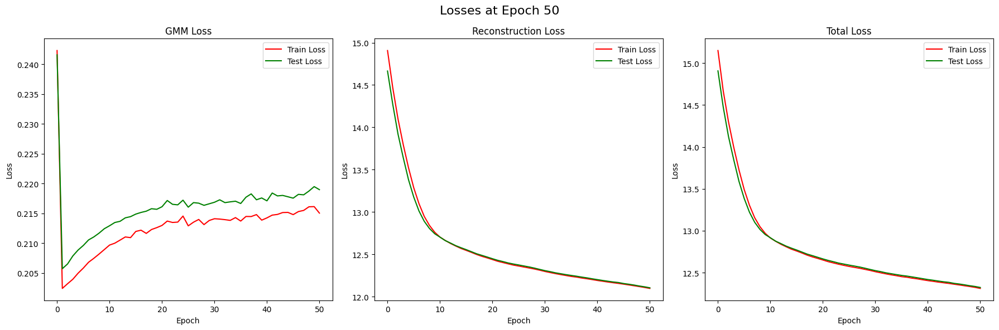

 10%|█         | 100/1000 [01:27<13:18,  1.13it/s]

epoch: 100


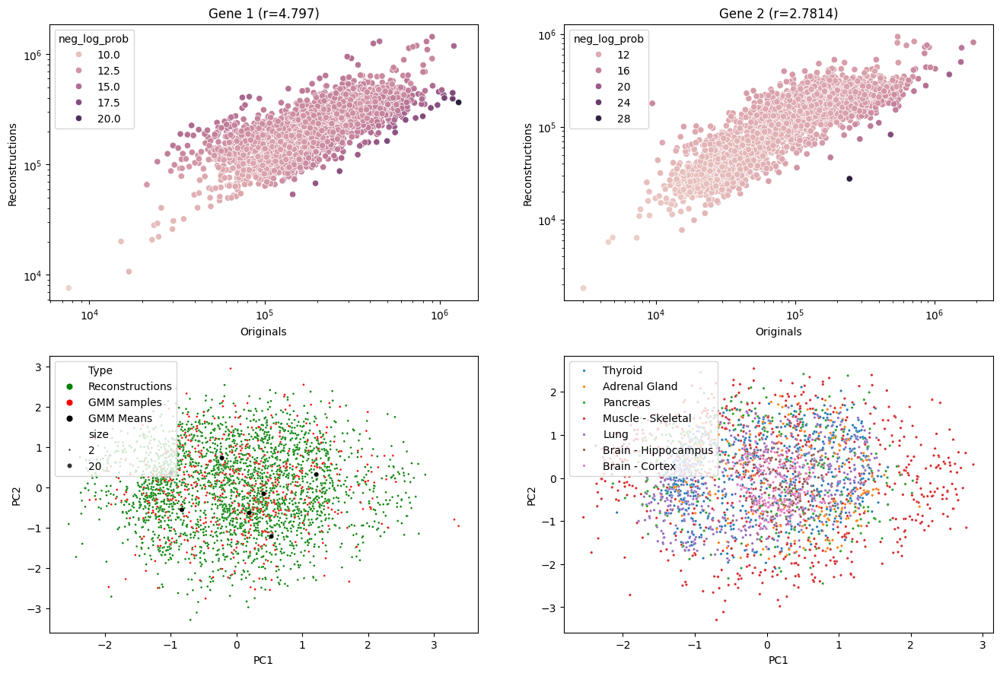

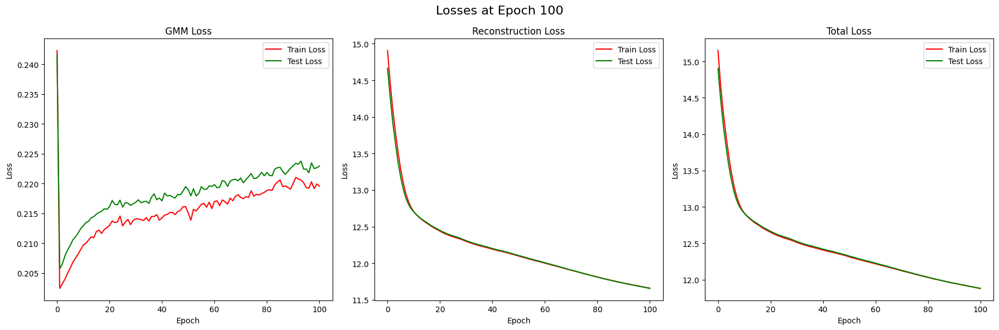

 15%|█▌        | 150/1000 [02:09<10:19,  1.37it/s]

epoch: 150


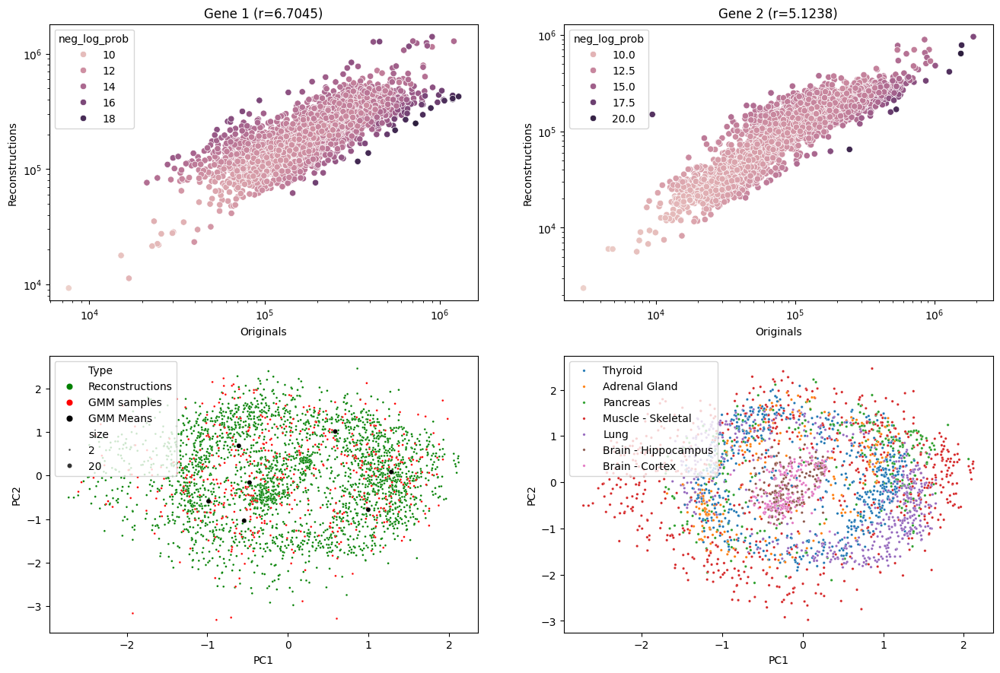

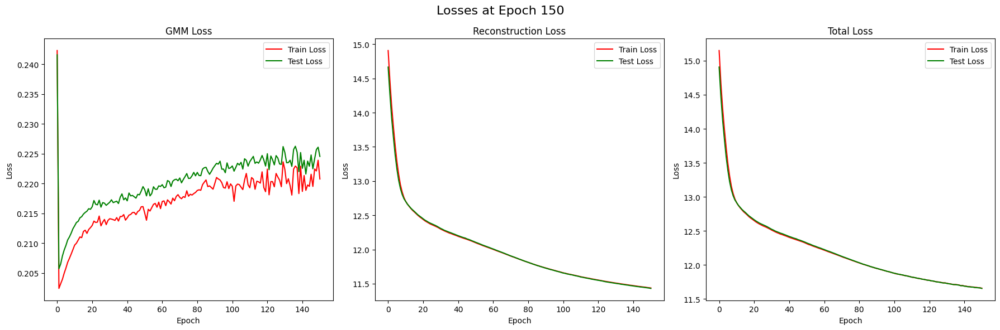

 20%|██        | 200/1000 [02:46<09:06,  1.46it/s]

epoch: 200


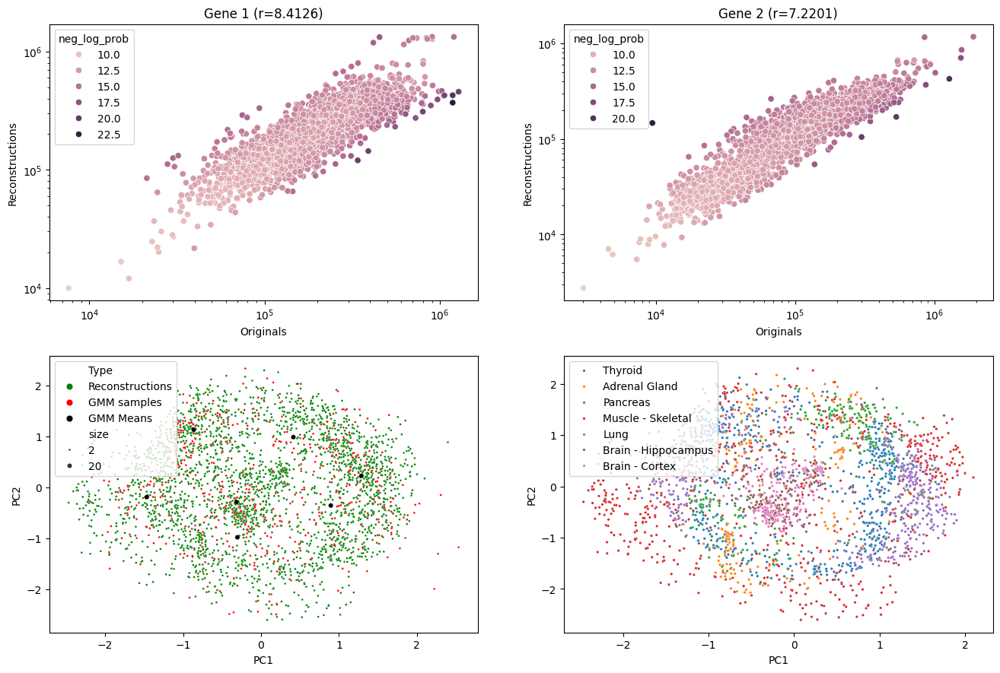

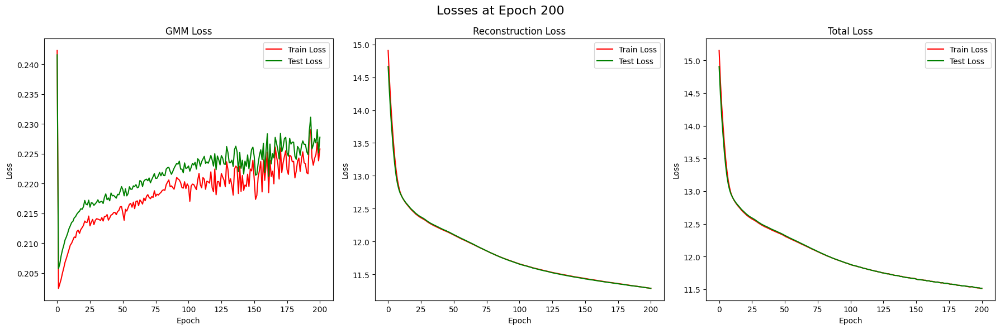

 25%|██▌       | 250/1000 [03:24<09:07,  1.37it/s]

epoch: 250


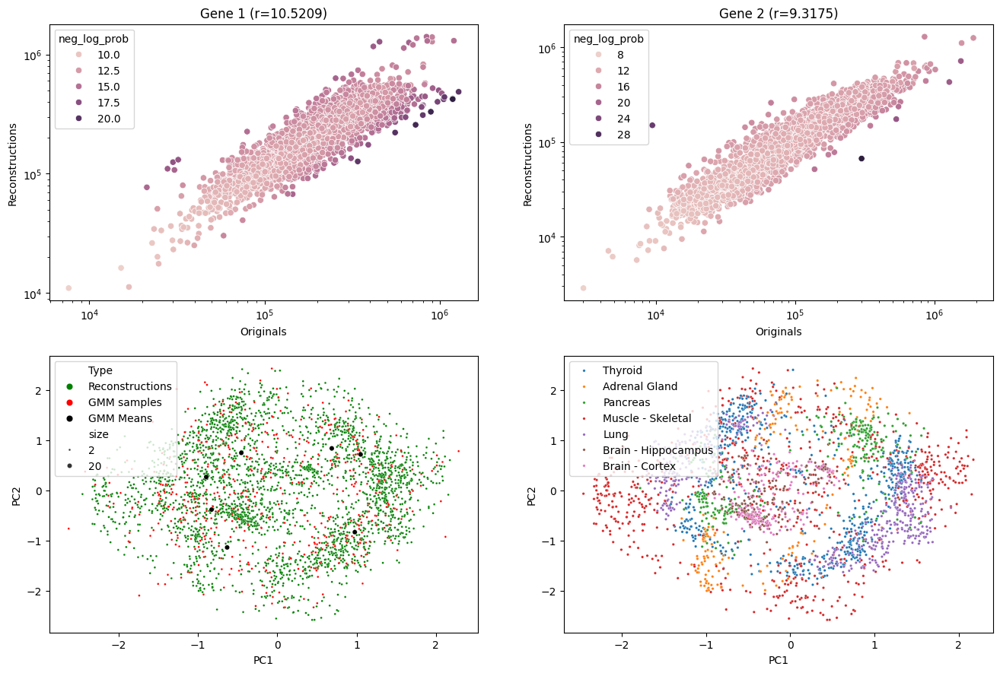

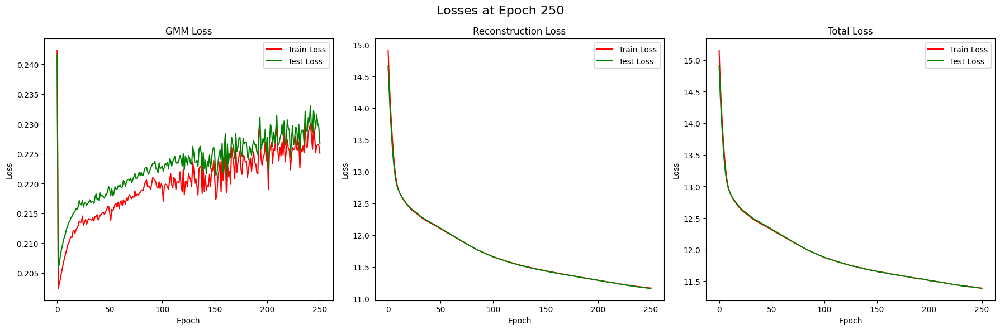

 30%|███       | 300/1000 [04:01<07:40,  1.52it/s]

epoch: 300


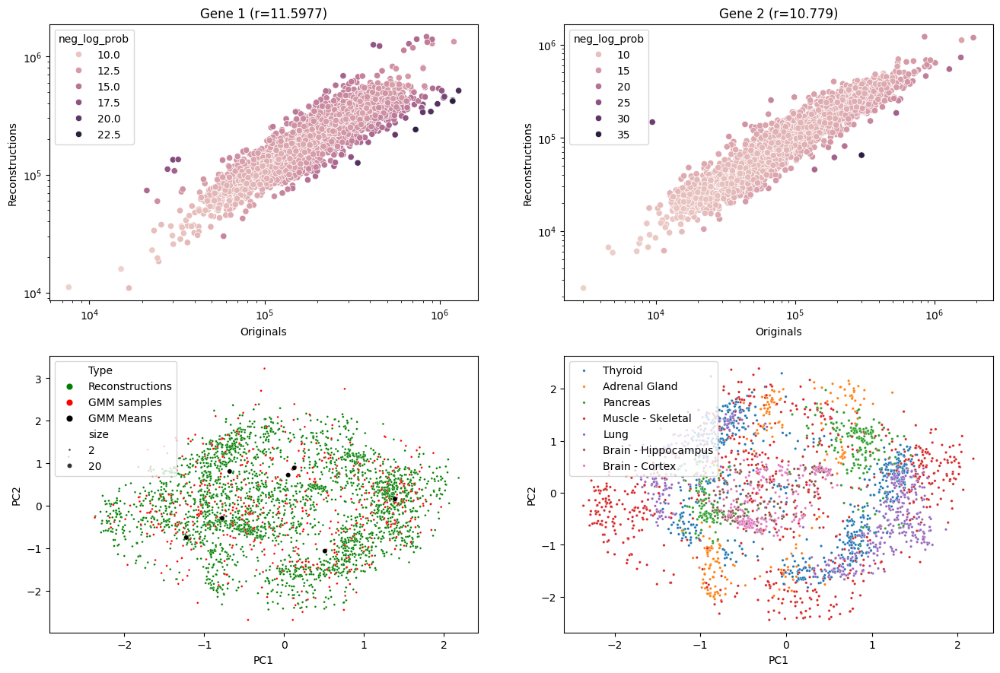

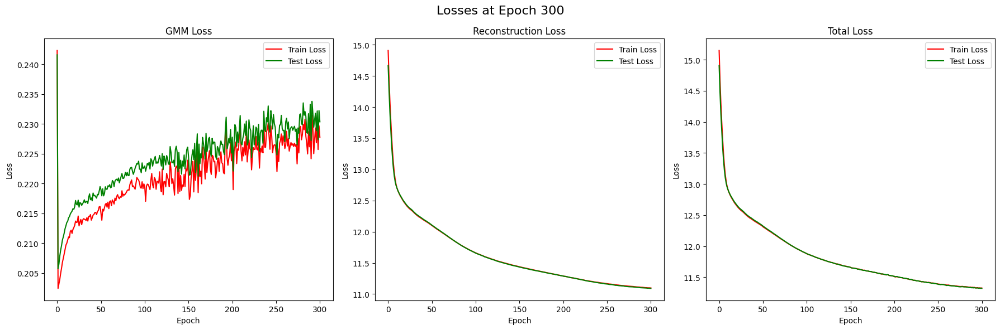

 35%|███▌      | 350/1000 [04:38<07:43,  1.40it/s]

epoch: 350


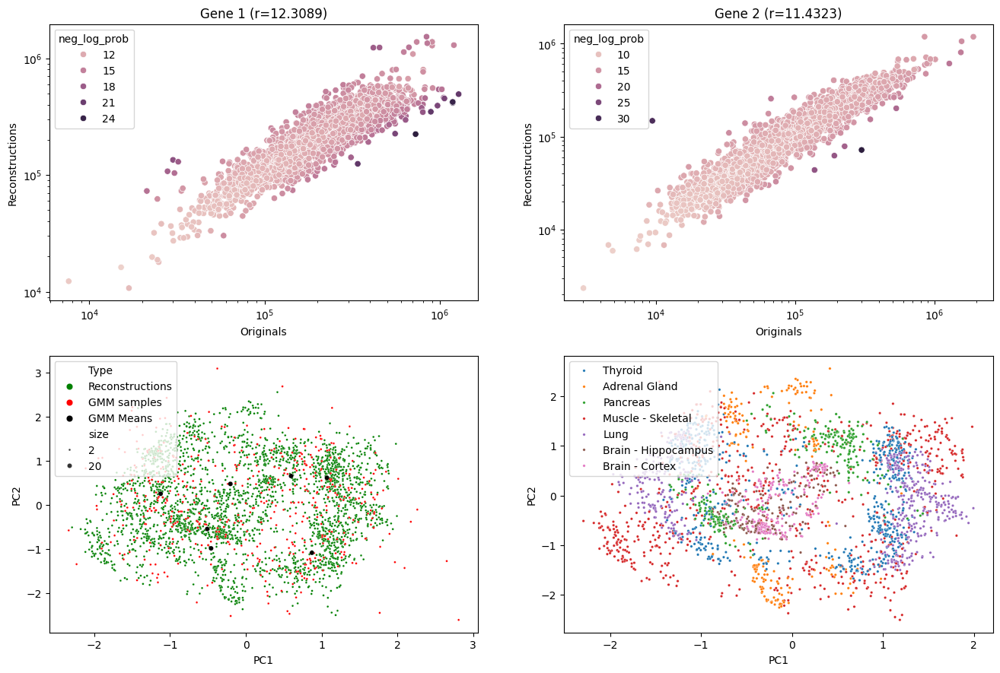

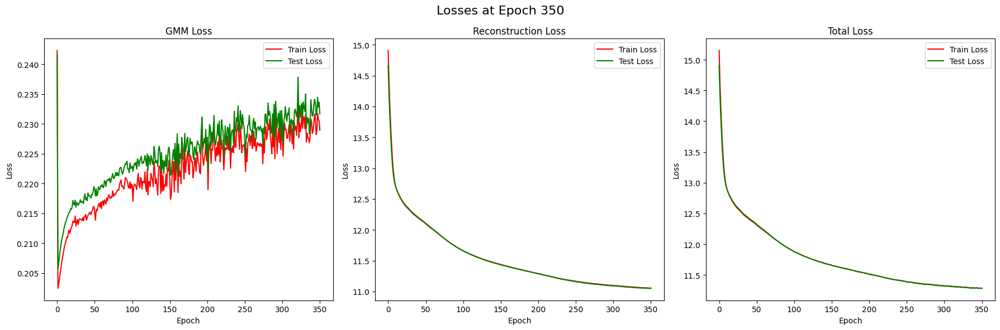

 40%|████      | 400/1000 [05:18<09:14,  1.08it/s]

epoch: 400


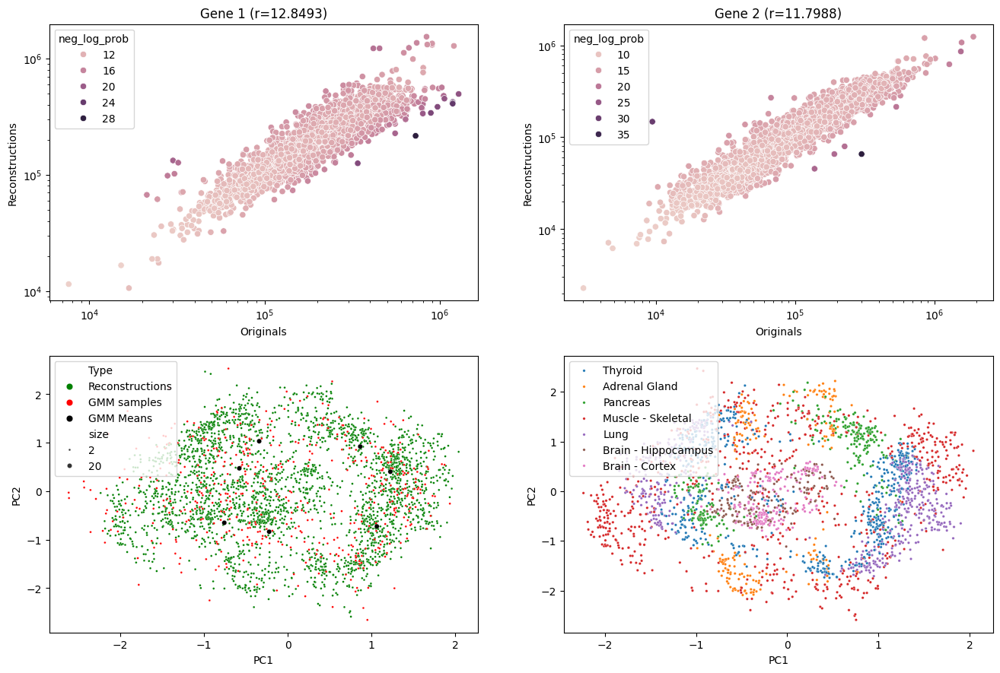

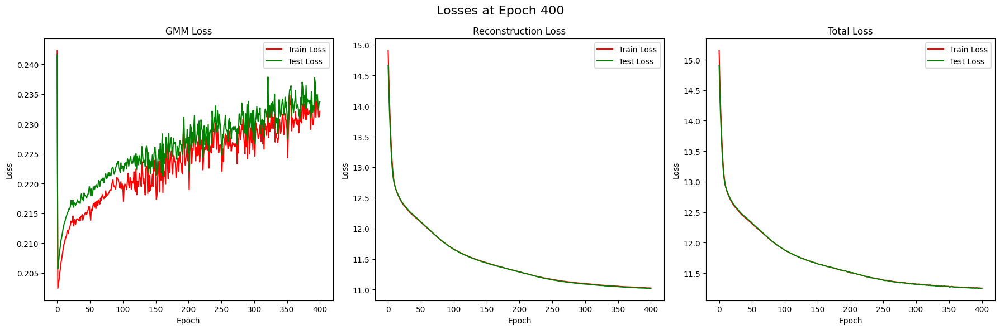

 45%|████▌     | 450/1000 [05:58<06:26,  1.42it/s]

epoch: 450


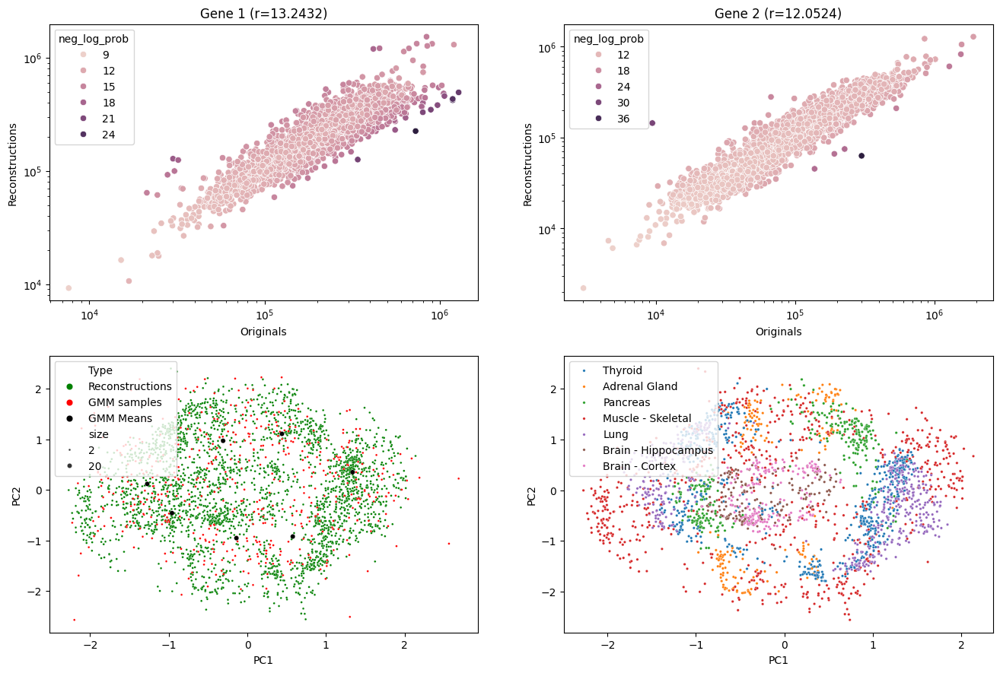

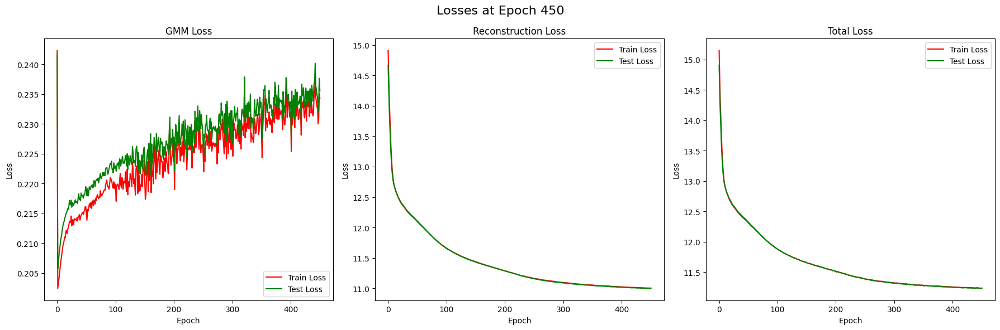

 50%|█████     | 500/1000 [06:37<05:51,  1.42it/s]

epoch: 500


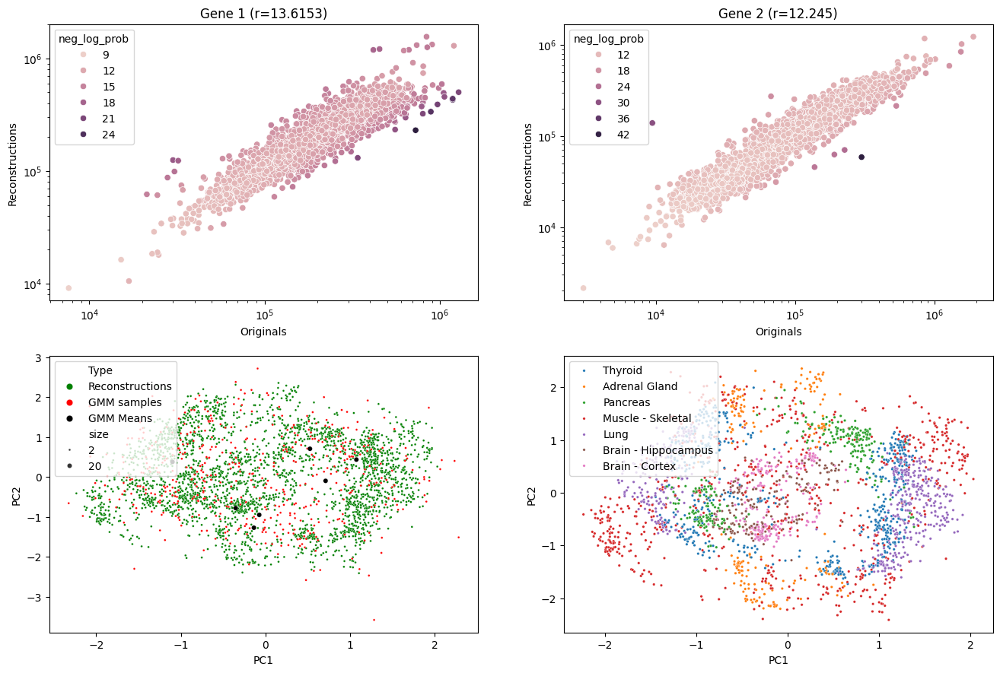

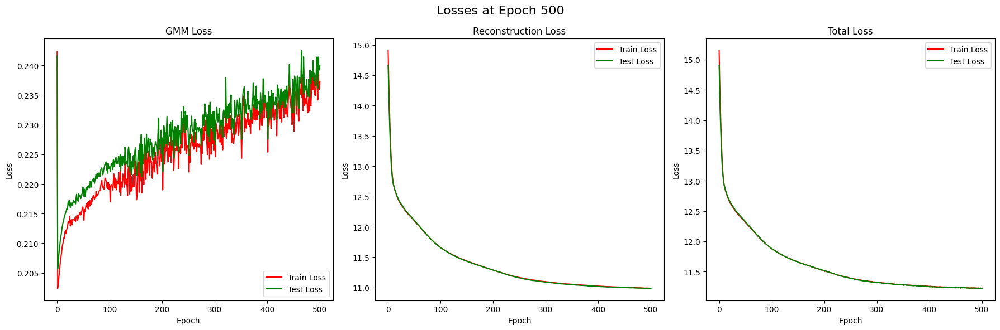

 55%|█████▌    | 550/1000 [07:17<05:21,  1.40it/s]

epoch: 550


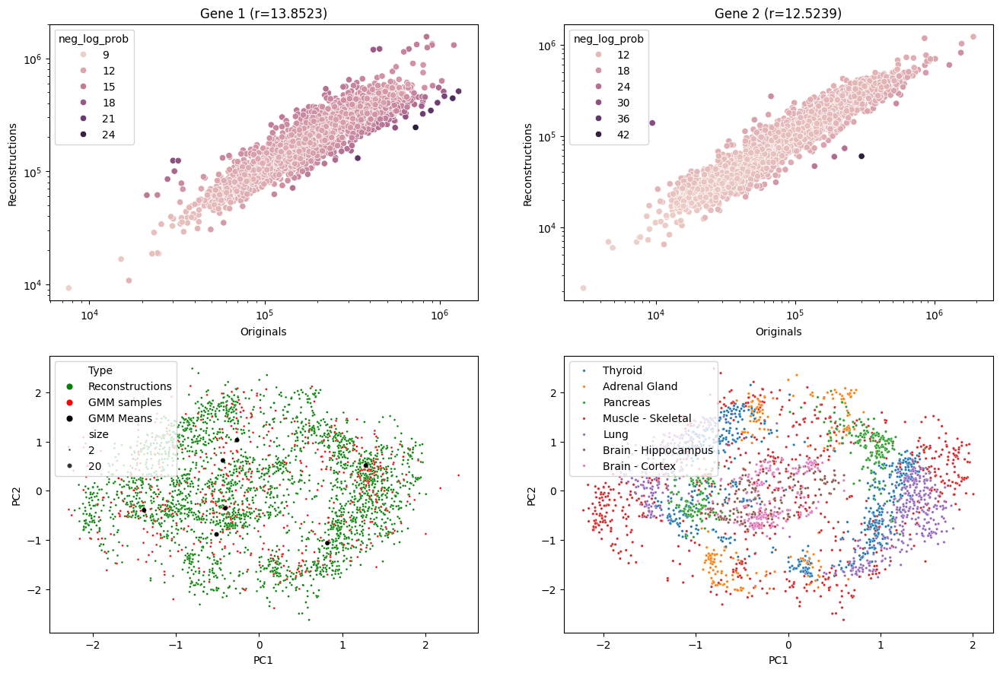

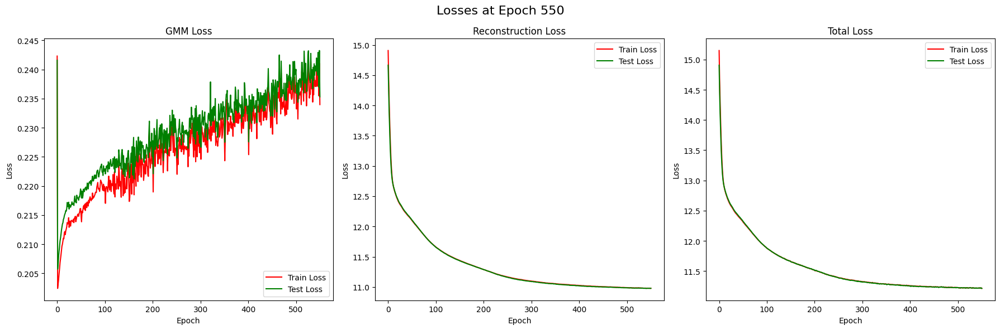

 60%|██████    | 600/1000 [07:56<04:41,  1.42it/s]

epoch: 600


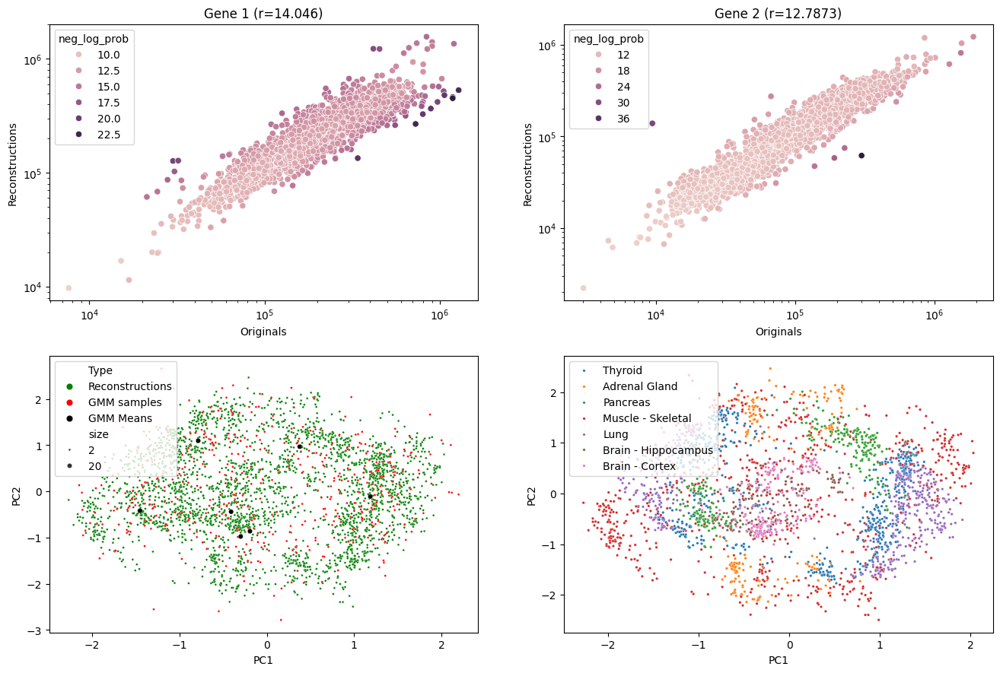

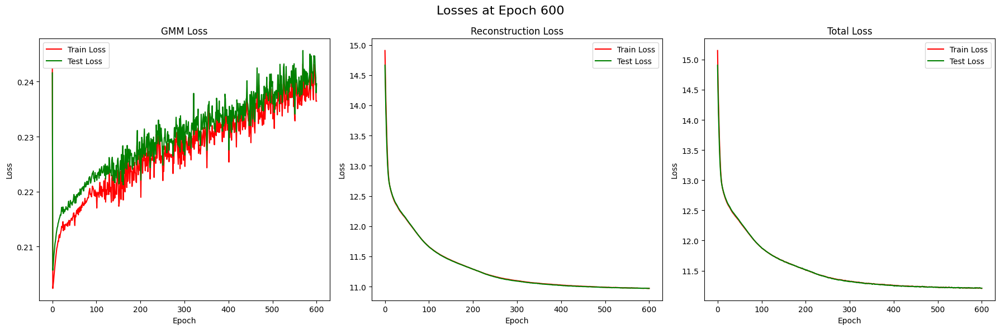

 65%|██████▌   | 650/1000 [08:35<04:06,  1.42it/s]

epoch: 650


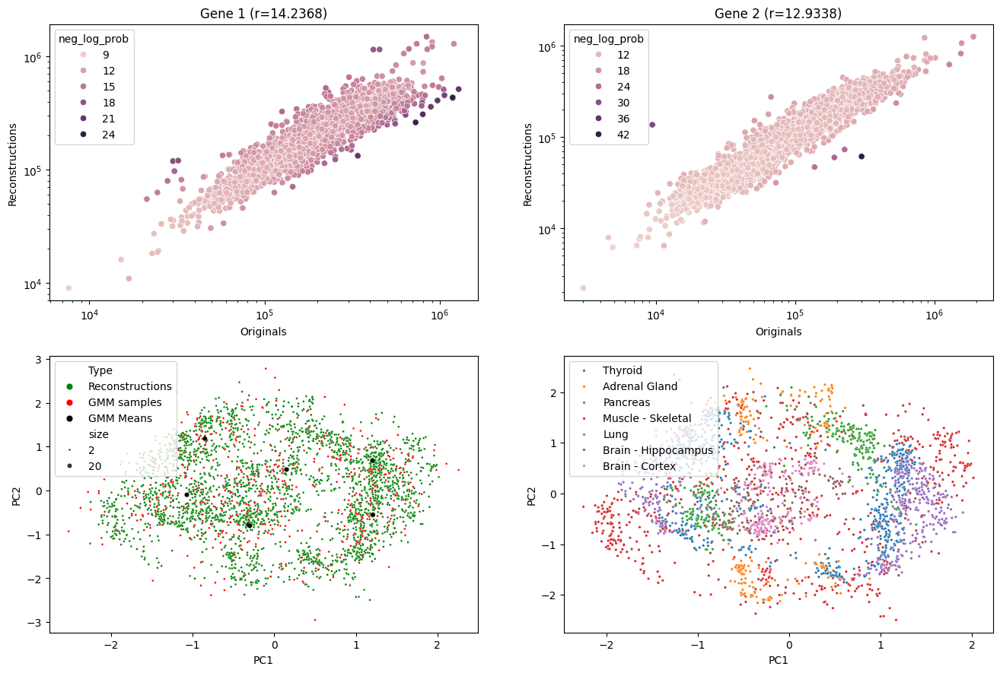

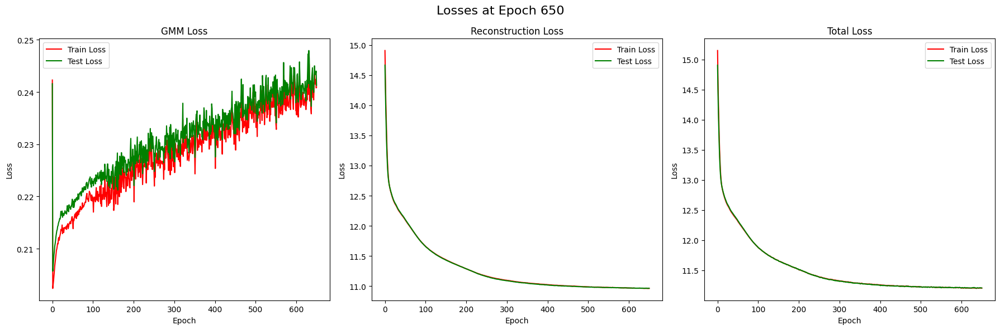

 70%|███████   | 700/1000 [09:15<03:37,  1.38it/s]

epoch: 700


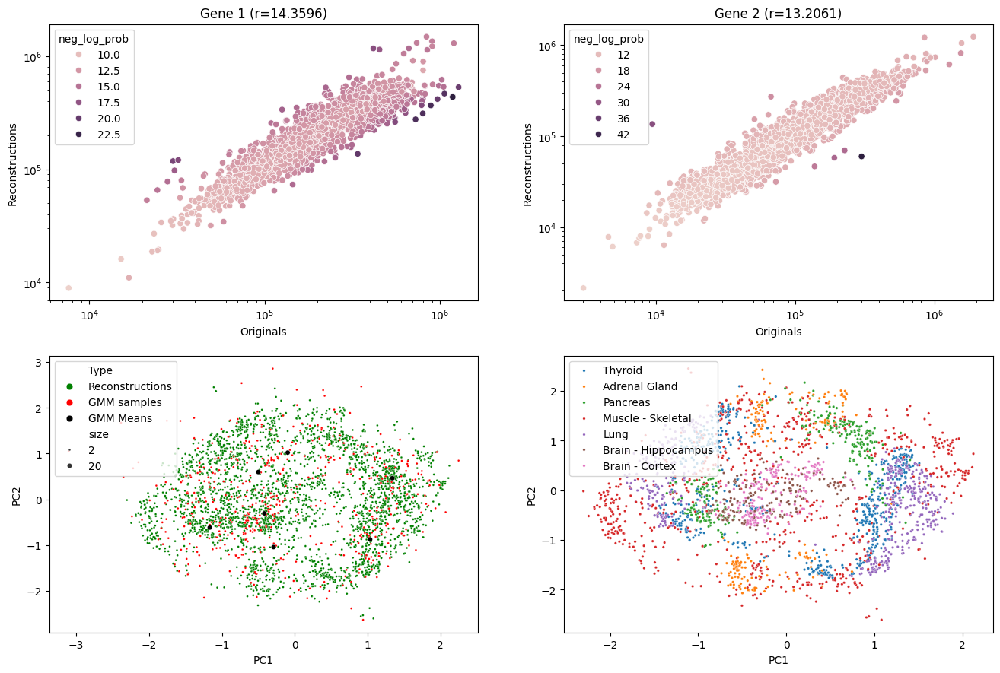

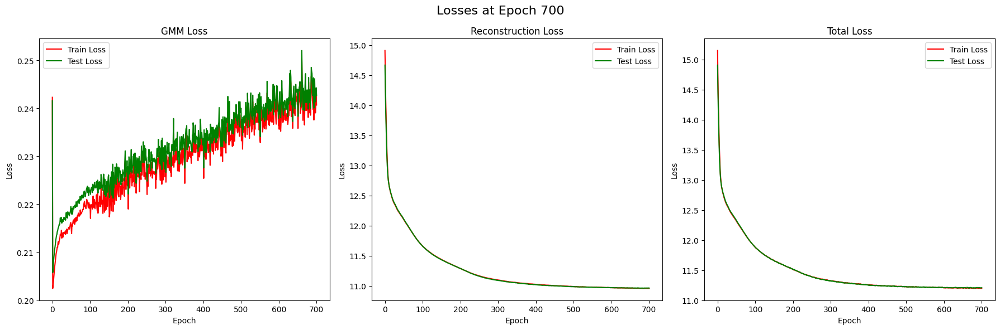

 75%|███████▌  | 750/1000 [09:54<02:54,  1.43it/s]

epoch: 750


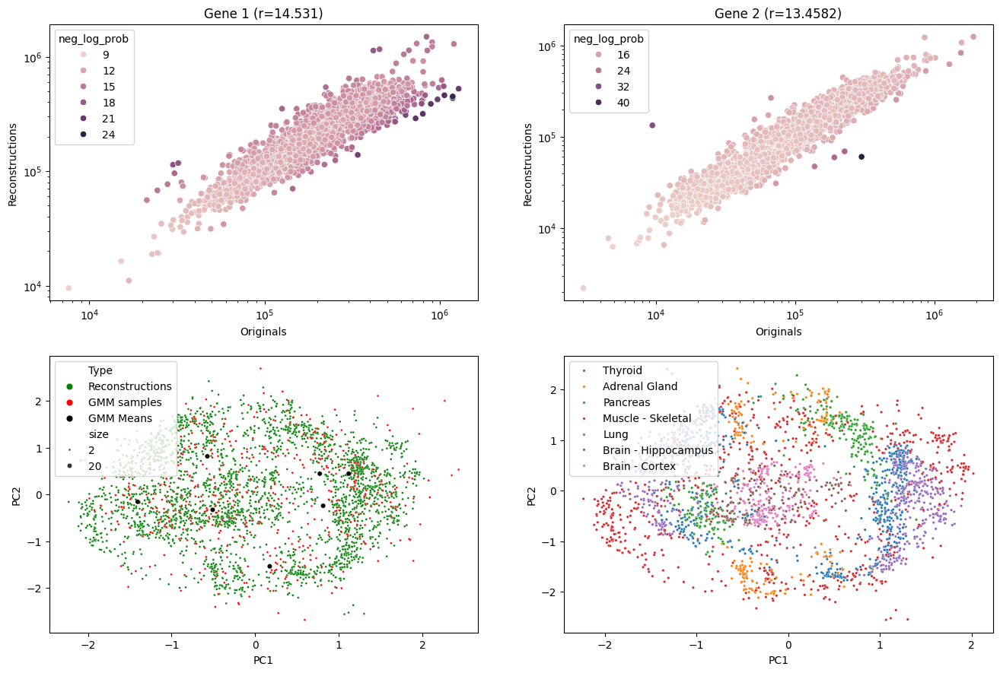

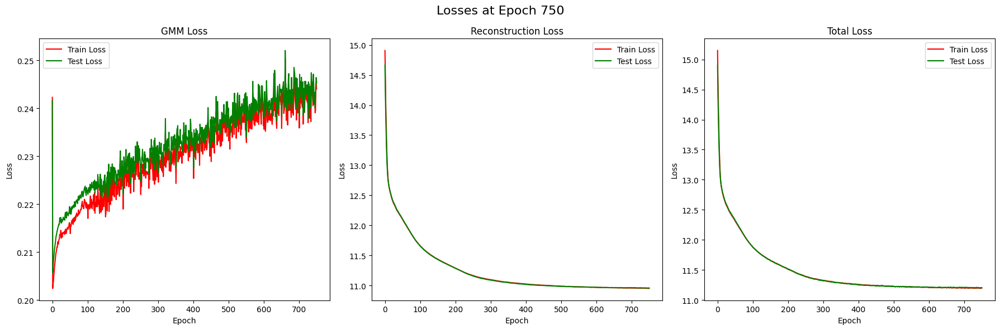

 80%|████████  | 800/1000 [10:33<02:21,  1.42it/s]

epoch: 800


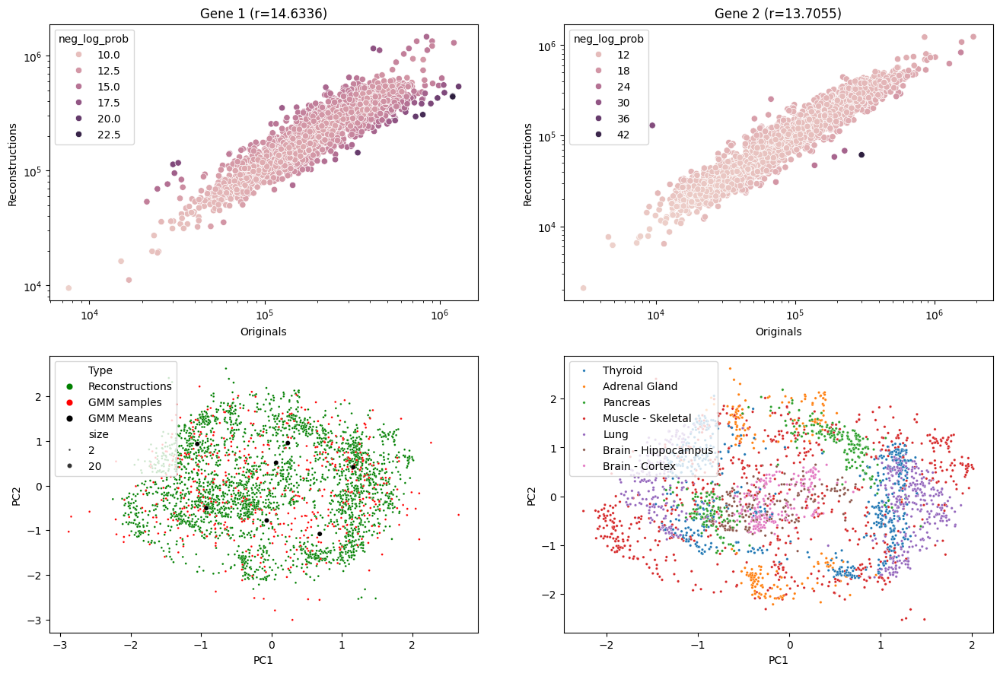

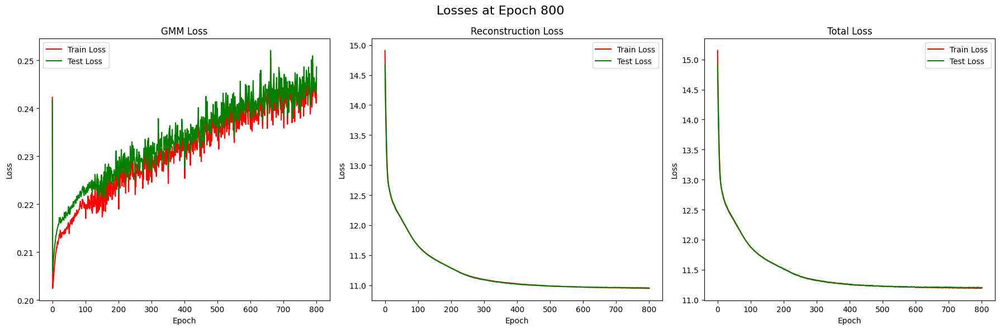

 85%|████████▌ | 850/1000 [11:13<01:46,  1.40it/s]

epoch: 850


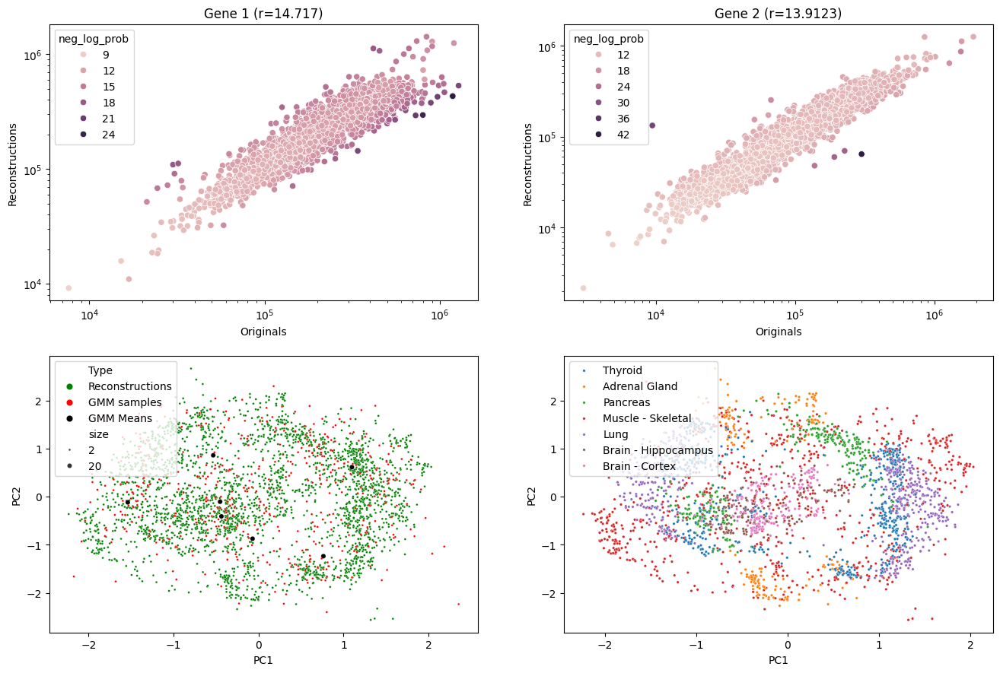

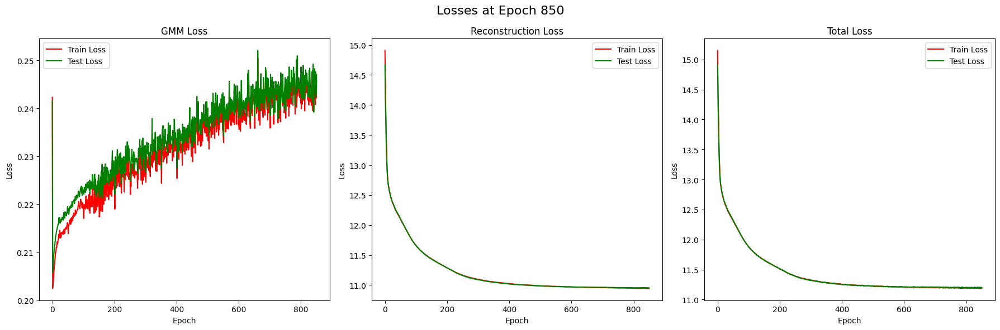

 90%|█████████ | 900/1000 [11:53<01:10,  1.41it/s]

epoch: 900


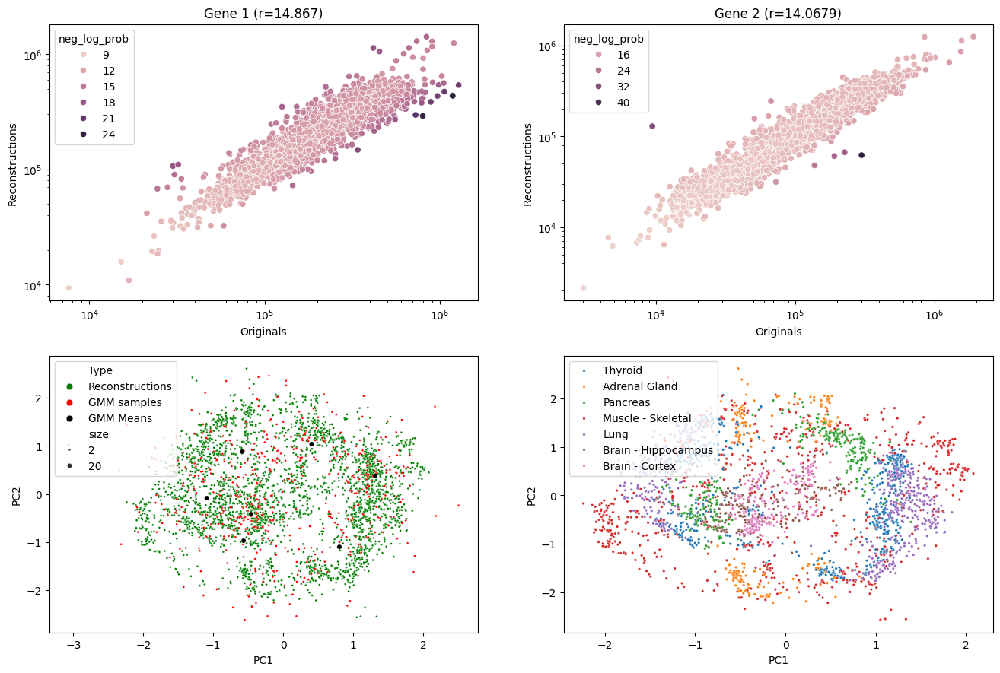

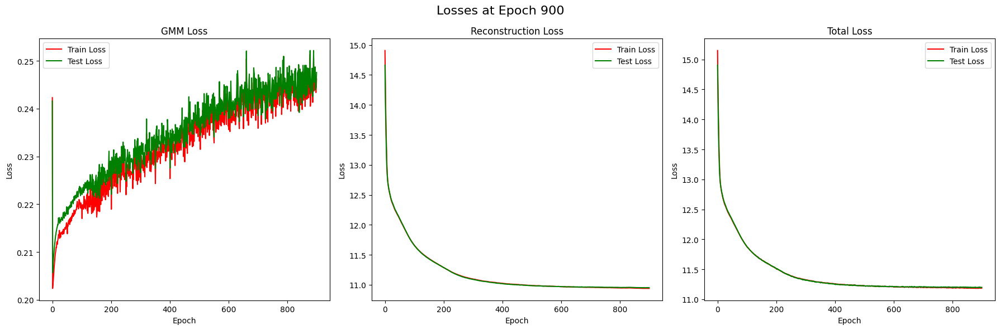

 95%|█████████▌| 950/1000 [12:32<00:35,  1.41it/s]

epoch: 950


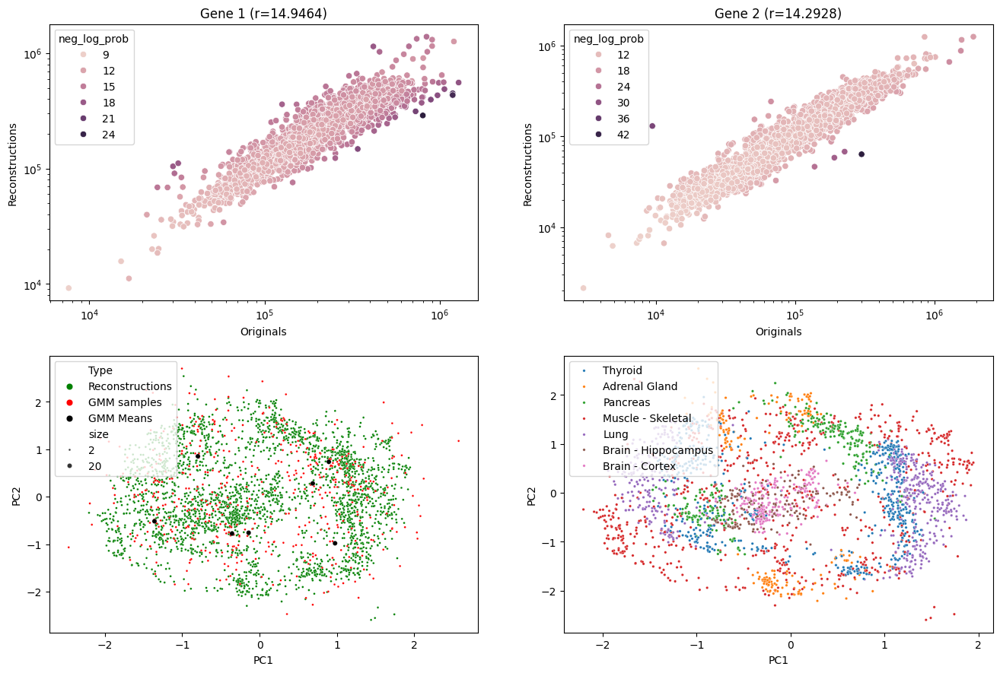

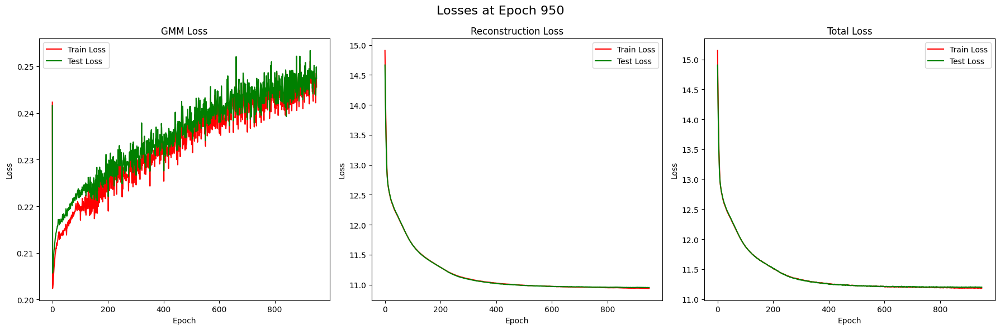

100%|██████████| 1000/1000 [13:12<00:00,  1.26it/s]
/home/asp/miniconda3/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


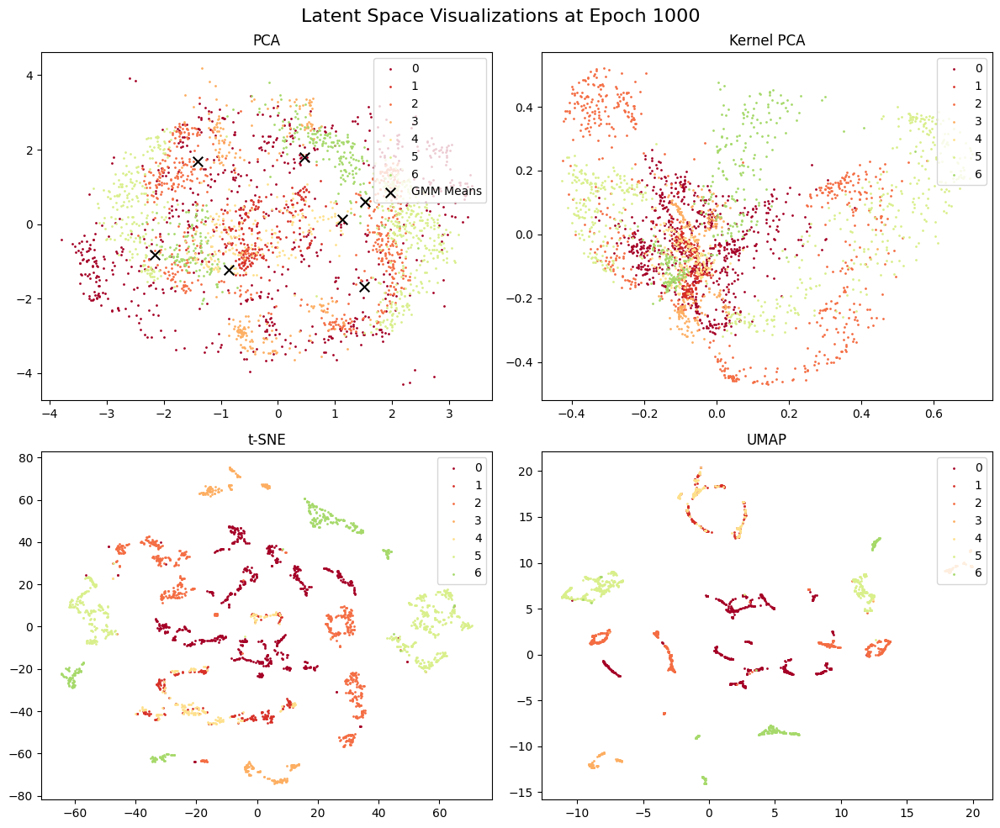

Clustering Metrics:
adjusted_rand_score: 0.06215483695268631
normalized_mutual_info_score: 0.11293116956949234
completeness_score: 0.09693950414657593
v_measure_score: 0.1105682943069603


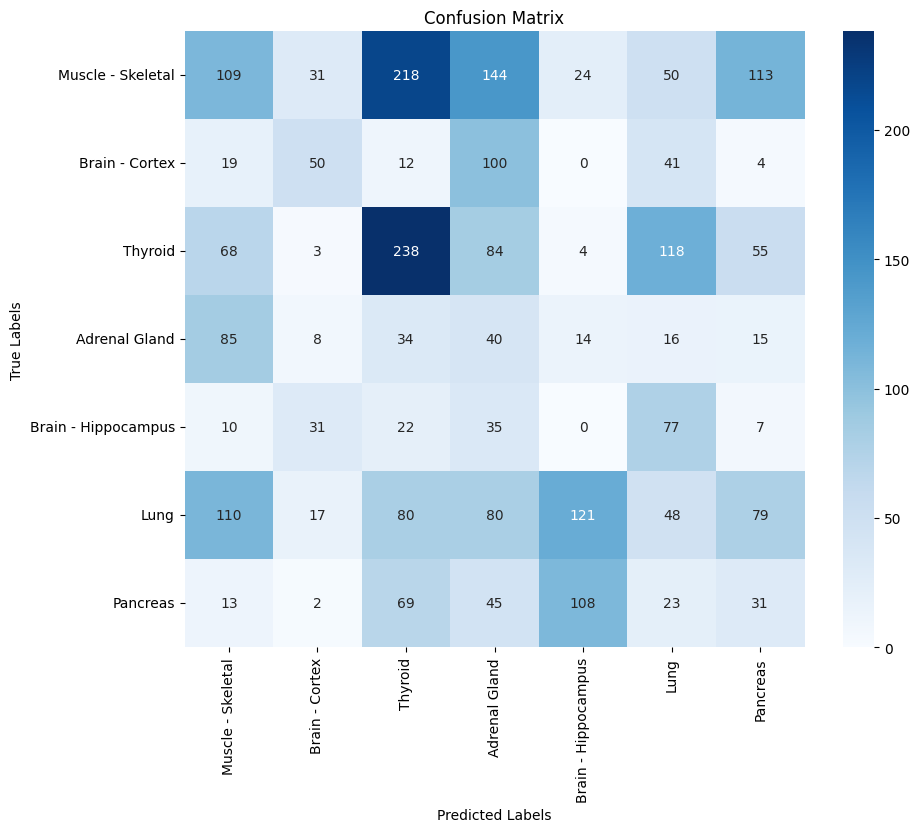

In [125]:
# Adjusted Training Loop
def train_loop(train_loader, test_loader, model, gmm, rep, test_rep, n_epochs, lrs, betas, wd, plot_step):
    model_optimizer = torch.optim.Adam(model.parameters(), lr=lrs[0], weight_decay=wd, betas=betas)
    rep_optimizer = torch.optim.Adam(rep.parameters(), lr=lrs[1], weight_decay=wd, betas=betas)
    testrep_optimizer = torch.optim.Adam(test_rep.parameters(), lr=lrs[1], weight_decay=wd, betas=betas)

    train_avg = []
    recon_avg = []
    test_avg = []
    recon_test_avg = []
    dist_avg = []
    dist_test_avg = []

    for epoch in tqdm(range(n_epochs)):
        train_avg.append(0)
        test_avg.append(0)
        recon_avg.append(0)
        recon_test_avg.append(0)
        dist_avg.append(0)
        dist_test_avg.append(0)

        # Train
        rep_optimizer.zero_grad()
        for idx, x, scaling in train_loader:
            x = x.to(device)
            scaling = scaling.to(device)
            idx = idx.to(device)
            model_optimizer.zero_grad()
            z = rep(idx)
            y = model(z)
            recon_loss_x = model.nb.loss(x, scaling.unsqueeze(1), y).sum()
            if epoch >= first_epoch_gmm:
                gmm_error = -lambda_gmm * torch.sum(gmm.score_samples(z))
                loss = recon_loss_x + gmm_error
            else:
                loss = recon_loss_x
                gmm_error = torch.tensor(0.0)
            loss.backward()
            model_optimizer.step()

            train_avg[-1] += loss.item()
            recon_avg[-1] += recon_loss_x.item()
            dist_avg[-1] += gmm_error.item()
        rep_optimizer.step()

        # Test
        testrep_optimizer.zero_grad()
        for idx, x, scaling in test_loader:
            x = x.to(device)
            scaling = scaling.to(device)
            idx = idx.to(device)
            z = test_rep(idx)
            y = model(z)
            recon_loss_x = model.nb.loss(x, scaling.unsqueeze(1), y).sum()
            if epoch >= first_epoch_gmm:
                gmm_error = -lambda_gmm * torch.sum(gmm.score_samples(z))
                loss = recon_loss_x + gmm_error
            else:
                loss = recon_loss_x
                gmm_error = torch.tensor(0.0)
            loss.backward()

            test_avg[-1] += loss.item()
            recon_test_avg[-1] += recon_loss_x.item()
            dist_test_avg[-1] += gmm_error.item()
        testrep_optimizer.step()

        # Update GMM after each epoch
        with torch.no_grad():
            representations = rep.z.detach().to(device)
            if epoch == first_epoch_gmm:
                gmm.fit(representations, max_iter=1000)
            elif epoch > first_epoch_gmm:
                if refit_gmm_interval and (epoch % refit_gmm_interval == 0 or epoch == n_epochs - 1):
                    gmm = GaussianMixture(n_features=latent_dim, n_components=n_components,
                                          covariance_type=covariance_type, init_params=init_params, device=device)
                    gmm.fit(representations, max_iter=1000)
                else:
                    gmm.fit(representations, max_iter=10, warm_start=True)

        train_avg[-1] /= (nsample * out_dim)
        test_avg[-1] /= (nsample_test * out_dim)
        recon_avg[-1] /= (nsample * out_dim)
        recon_test_avg[-1] /= (nsample_test * out_dim)
        dist_avg[-1] /= (nsample * latent_dim * n_components)
        dist_test_avg[-1] /= (nsample_test * latent_dim * n_components)

        if epoch % plot_step == 0:
            plot_negbino(mod=model, tdata=train_loader.dataset.data, r=rep, e=epoch, gmm=gmm, scaling='mean', labels=train_data['tissue'].values)
            plot_loss(dist_avg, dist_test_avg, recon_avg, recon_test_avg, epoch)

    # Final plotting after training completes
    plot_latent_space_visualizations(representations=rep.z, labels=torch.tensor(train_dataset.labels).to(device), 
                                     n_features=latent_dim, epoch=n_epochs, gmm_means=gmm.means_, fraction=1)

# Use tissue types as labels
data['label'] = data['tissue']

# Filter specific tissues
tissues = ['Muscle - Skeletal', 'Brain - Cortex', 'Brain - Hippocampus',
           'Adrenal Gland', 'Thyroid', 'Lung', 'Pancreas']
gtex_raw_total = data[data['tissue'].isin(tissues)]

# print size of the dataset
print("Size of the dataset:", gtex_raw_total.shape)

# Sample data and preprocess
gtex_raw = gtex_raw_total.sample(3382, random_state=random_state)

# Drop columns with only zeros
gtex_raw = gtex_raw.loc[:, (gtex_raw != 0).any(axis=0)]

# Map tissue names to numerical labels
tissue_to_label = {tissue: idx for idx, tissue in enumerate(gtex_raw['tissue'].unique())}
gtex_raw['label'] = gtex_raw['tissue'].map(tissue_to_label)

# Ensure 'label' is included before splitting
gtex_raw['label'] = gtex_raw['label'].astype(int)

# Remove non-numeric columns except 'tissue' and 'label'
non_numeric_cols = gtex_raw.select_dtypes(exclude=[np.number]).columns.tolist()
non_numeric_cols = [col for col in non_numeric_cols if col not in ['tissue', 'label']]
if non_numeric_cols:
    print("Dropping non-numeric columns:", non_numeric_cols)
    gtex_raw = gtex_raw.drop(columns=non_numeric_cols)

# Move 'label' column to the end
label_col = gtex_raw.pop('label')
gtex_raw['label'] = label_col

# Make data split for train and validation sets
gtex_raw = shuffle(gtex_raw, random_state=random_state)
train_ratio = 0.8
train_size = int(train_ratio * len(gtex_raw))
train_data = gtex_raw.iloc[:train_size, :].copy()
test_data = gtex_raw.iloc[train_size:, :].copy()

# Create data loaders
batch_size = 256
train_dataset = GeneExpressionDataset(train_data, label_column='label')
test_dataset = GeneExpressionDataset(test_data, label_column='label')
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Get labels for evaluation
all_labels = torch.tensor(train_dataset.get_labels(), device=device)

# Define model parameters
latent_dim = 5
hidden_dim = 100
out_dim = train_dataset.data.shape[1]
n_components = len(tissue_to_label)
covariance_type = 'full'
init_params = 'kmeans'
print("Number of components:", n_components)
epochs = 1000
lambda_gmm = 1.0
first_epoch_gmm = 0
refit_gmm_interval = 50
lrs = [1e-3, 1e-2]
betas = (0.9, 0.999)
wd = 1e-5
plot_step = 50

# Initialize Representation Layers
nsample = len(train_dataset)
nsample_test = len(test_dataset)
rep = RepresentationLayer(values=torch.randn(nsample, latent_dim).to(device))
test_rep = RepresentationLayer(values=torch.randn(nsample_test, latent_dim).to(device))

# Initialize DGD model
model = DGD(latent=latent_dim, hidden=hidden_dim, out=out_dim, r_init=2, scaling_type='mean').to(device)

# Initialize GMM
gmm = GaussianMixture(n_features=latent_dim, n_components=n_components,
                      covariance_type=covariance_type, init_params=init_params, device=device)

model_optimizer = torch.optim.Adam(model.parameters(), lr=lrs[0], weight_decay=wd, betas=betas)
rep_optimizer = torch.optim.Adam(rep.parameters(), lr=lrs[1], weight_decay=wd, betas=betas)
testrep_optimizer = torch.optim.Adam(test_rep.parameters(), lr=lrs[1], weight_decay=wd, betas=betas)


# Run the training loop
train_loop(train_loader, test_loader, model, gmm, rep, test_rep, epochs, lrs, betas, wd, plot_step)

# Evaluate clustering
X = rep.z.detach().to(device)
true_labels = torch.tensor(train_dataset.get_labels()).to(device)
results = gmm.evaluate_clustering(X, true_labels=true_labels, metrics=[
    "adjusted_rand_score",
    "normalized_mutual_info_score",
    "homoGeneity_score",
    "completeness_score",
    "v_measure_score",
    "classification_report",
    "confusion_matrix",
])

# Print metrics
print("Clustering Metrics:")
for metric, score in results.items():
    if metric not in ['confusion_matrix', 'classification_report']:
        print(f"{metric}: {score}")

# Plot confusion matrix
cm = results['confusion_matrix']
plt.figure(figsize=(10, 8))
sns.heatmap(cm.cpu(), annot=True, fmt='d', cmap='Blues', xticklabels=tissue_to_label.keys(), yticklabels=tissue_to_label.keys())
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


/home/asp/miniconda3/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


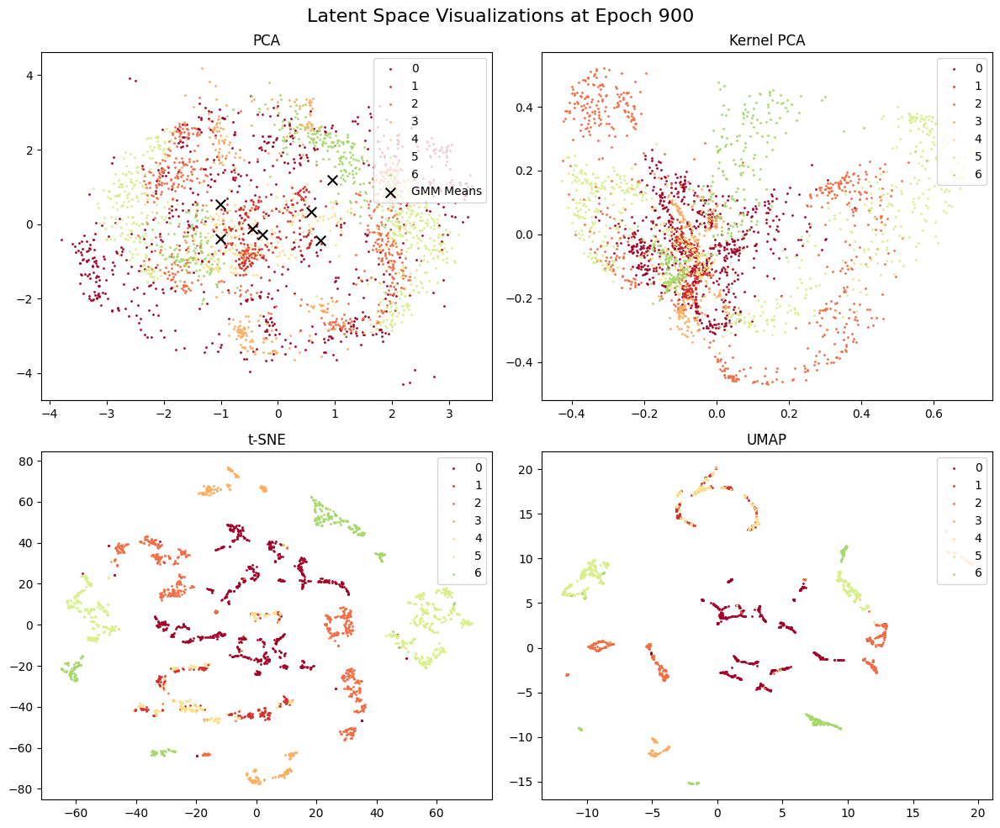

In [128]:
plot_latent_space_visualizations(representations=rep.z, labels=torch.tensor(train_dataset.labels).to(device), 
                                     n_features=latent_dim, epoch=900, gmm_means=gmm.means_, fraction=1, folder=folder)